In [14]:
# !pip install umap-learn

In [1]:
# Load required libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go
import umap.umap_ as umap
from scipy.spatial import cKDTree
import pickle

# Import custom functions
from structure_index import compute_structure_index, draw_graph

# Load Data

In [2]:
with open('all_orn_data.pkl', 'rb') as file:
    orn_data = pickle.load(file)
orn_data.keys()

dict_keys(['ORN1_trials', 'ORN1_waveforms', 'ORN3_trials', 'ORN3_waveforms', 'ORN4_trials', 'ORN4_waveforms', 'ORN6_trials', 'ORN6_waveforms', 'ORN13_trials', 'ORN13_waveforms'])

In [3]:
orn1_waveforms = orn_data['ORN1_waveforms']
orn1_trials = orn_data['ORN1_trials']
orn4_waveforms = orn_data['ORN4_waveforms']
orn4_trials = orn_data['ORN4_trials']

# Intrinsic Dimension and UMAP embeddings

In [5]:
def abids(X,k):
    search_struct = cKDTree(X)
    return np.array([abid(X,k,x,search_struct) for x in X])


def abid(X,k,x,search_struct,offset=1):
    neighbor_norms, neighbors = search_struct.query(x,k+offset)
    neighbors = X[neighbors[offset:]] - x
    normed_neighbors = neighbors / neighbor_norms[offset:,None]
    # Original publication version that computes all cosines
    # coss = normed_neighbors.dot(normed_neighbors.T)
    # return np.mean(np.square(coss))**-1
    # Using another product to get the same values with less effort
    para_coss = normed_neighbors.T.dot(normed_neighbors)
    return k**2 / np.sum(np.square(para_coss))

In [6]:
ID = np.round(np.nanmean(abids(orn1_waveforms, 50)))
ID

4.0

In [7]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(orn1_waveforms)
emb_orn1 = embedding.embedding_

umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(orn4_waveforms)
emb_orn4 = embedding.embedding_

C:\Users\u525432\AppData\Roaming\Python\Python312\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\u525432\AppData\Roaming\Python\Python312\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


# Alignment

In [8]:
# Rotation and Translation of dataset to align it to another dataset (template) based on a feature
# Arguments:
# data = Dataset of size N to be aligned
# feature = an array of size N representing alignment feature
# template_data = Dataset to which (data) will be aligned
# template_feature = an array representing alignment feature of the template data
def align_point_cloud(data, feature,
                      template_data,
                      template_feature,
                      n_bins=15,
                      n_neighbors=15,
                      dims=None,
                      distance_metric='euclidean',
                      discrete_label=False,
                      num_shuffles=10,
                      verbose=False):
    params = {
        'n_bins': n_bins,
        'n_neighbors': n_neighbors,
        'dims': dims,
        'distance_metric': distance_metric,
        'discrete_label': discrete_label,
        'num_shuffles': num_shuffles,
        'verbose': verbose,
    }

    # Get bins from the data
    SI, binLabel, overlapMat, sSI = compute_structure_index(data, np.array(feature), **params)
    SI_temp, binLabel_temp, overlapMat_temp, sSI_temp = compute_structure_index(template_data, np.array(template_feature), **params)

    # Get centroids of bins (p and p'); these are the points that will be aligned
    p = []
    for i in range(params['n_bins']):
        p.append(np.mean(data[binLabel[0] == i], axis=0))
    p = np.array(p)
    
    p_temp = []
    for i in range(params['n_bins']):
        p_temp.append(np.mean(template_data[binLabel_temp[0] == i], axis=0))
    p_temp = np.array(p_temp)

    # q = p - mean(p)
    # Get deviations of points from their means (q and q'); the Qs are used to get the scatter matrix H
    p_mean = np.mean(p, axis=0)
    p_temp_mean = np.mean(p_temp, axis=0)
    q = p - p_mean
    q_temp = p_temp - p_temp_mean

    # Get Rotation matrix
    H = np.dot(q_temp.T, q)
    U, S, Vh = np.linalg.svd(H, full_matrices=True)
    R = np.dot(U, Vh)
    if np.linalg.det(R) < 0:
        Vh[Vh.shape[0]-1, :] = Vh[Vh.shape[0]-1, :] * (-1)
        R = np.dot(U, Vh)

    T = p_temp_mean - np.dot(p_mean, R)
    new_data = np.dot(data, R) + T
    return new_data

In [9]:
new_emb_orn4 = align_point_cloud(emb_orn4, orn4_trials['peak_values'], emb_orn1, orn1_trials['peak_values'],
                                n_bins=20,
                                n_neighbors=15)

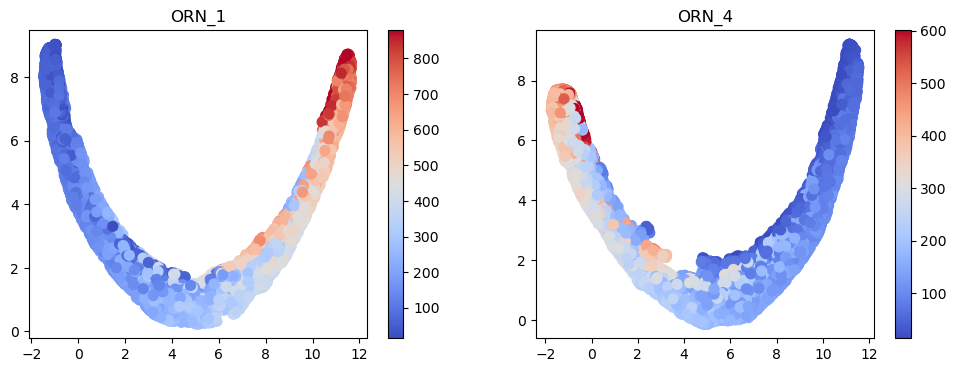

In [10]:
plt.subplots(1,2,figsize=(12,4))

plt.subplot(1,2,1)
plt.scatter(emb_orn1[:,0], emb_orn1[:,1], c=orn1_trials['peak_values'],
            vmin=np.percentile(orn1_trials['peak_values'],1),
            vmax=np.percentile(orn1_trials['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_1')

plt.subplot(1,2,2)
plt.scatter(emb_orn4[:,0], emb_orn4[:,1], c=orn4_trials['peak_values'],
            vmin=np.percentile(orn4_trials['peak_values'],1),
            vmax=np.percentile(orn4_trials['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_4');

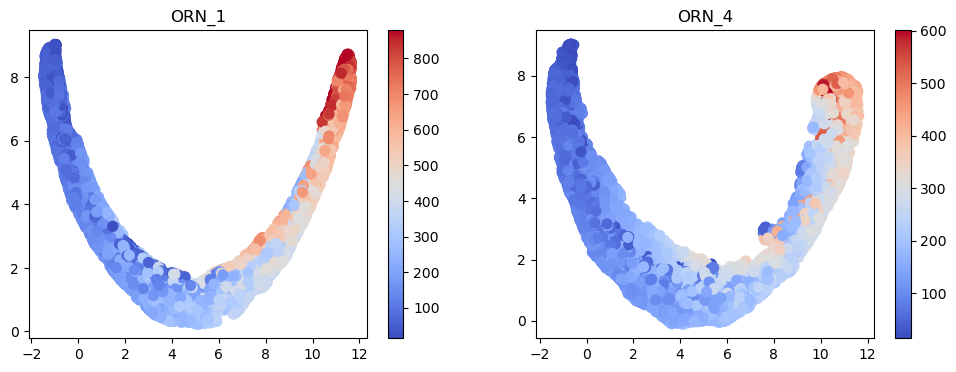

In [11]:
plt.subplots(1,2,figsize=(12,4))

plt.subplot(1,2,1)
plt.scatter(emb_orn1[:,0], emb_orn1[:,1], c=orn1_trials['peak_values'],
            vmin=np.percentile(orn1_trials['peak_values'],1),
            vmax=np.percentile(orn1_trials['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_1')

plt.subplot(1,2,2)
plt.scatter(new_emb_orn4[:,0], new_emb_orn4[:,1], c=orn4_trials['peak_values'],
            vmin=np.percentile(orn4_trials['peak_values'],1),
            vmax=np.percentile(orn4_trials['peak_values'],99),
            cmap='coolwarm', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_4');

### 3D Plots

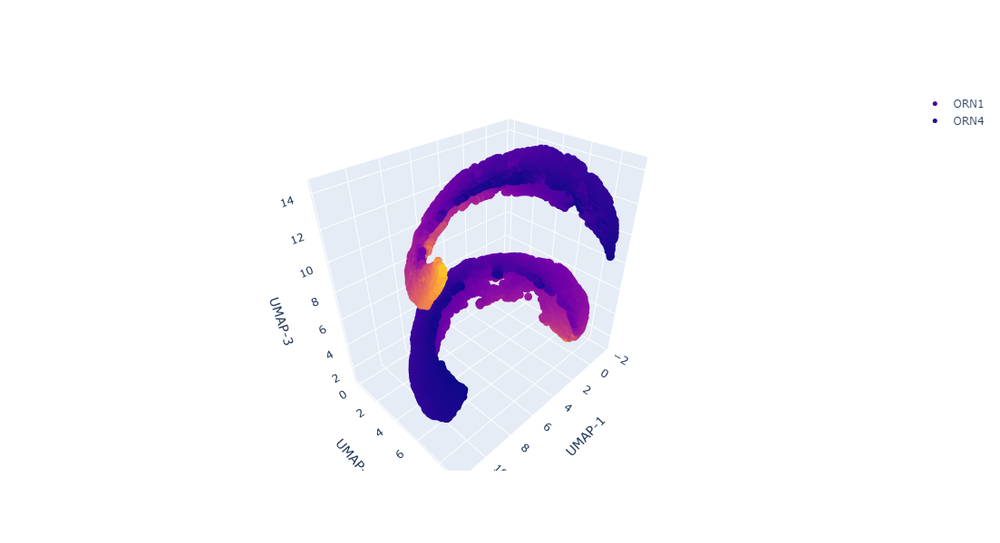

In [12]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go

scatter1 = go.Scatter3d(
    x=emb_orn1[:, 0],
    y=emb_orn1[:, 1],
    z=emb_orn1[:, 2]+5,
    mode='markers',
    marker=dict(
        size=5,color=orn1_trials['peak_values'],
        # colorscale='viridis',
    ),
    name='ORN1'
)

scatter2 = go.Scatter3d(
    x=emb_orn4[:, 0],
    y=emb_orn4[:, 1],
    z=emb_orn4[:, 2],
    mode='markers',
    marker=dict(
        size=5,color=orn4_trials['peak_values'],
        # colorscale='viridis',
    ),
    name='ORN4'
)

# Combine both scatter plots into a single figure
fig = go.Figure(data=[scatter1, scatter2])

# Update the layout of the figure
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    )
)

# Show the figure
fig.show()

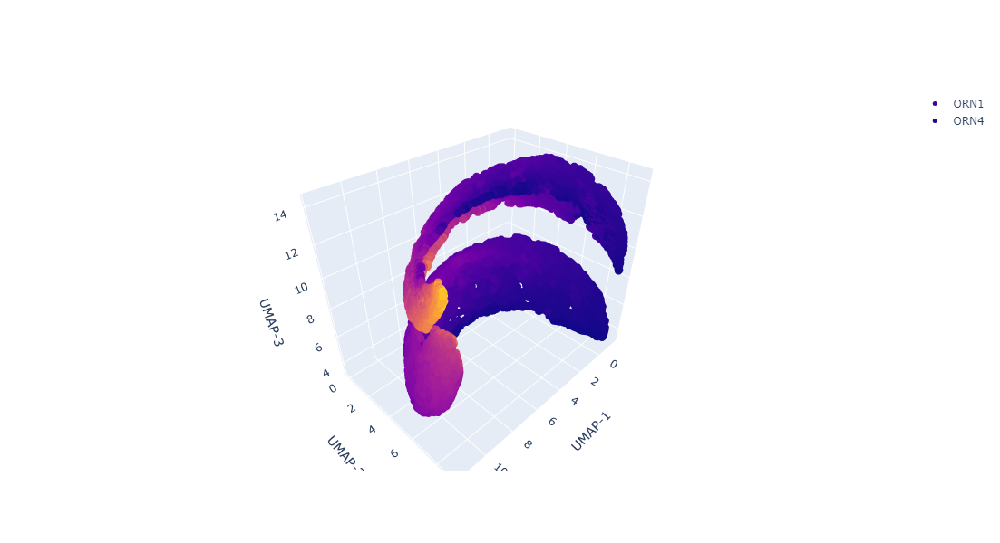

In [13]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go

scatter1 = go.Scatter3d(
    x=emb_orn1[:, 0],
    y=emb_orn1[:, 1],
    z=emb_orn1[:, 2]+5,
    mode='markers',
    marker=dict(
        size=5,color=orn1_trials['peak_values'],
        # colorscale='viridis',
    ),
    name='ORN1'
)

scatter2 = go.Scatter3d(
    x=new_emb_orn4[:, 0],
    y=new_emb_orn4[:, 1],
    z=new_emb_orn4[:, 2],
    mode='markers',
    marker=dict(
        size=5,color=orn4_trials['peak_values'],
        # colorscale='viridis',
    ),
    name='ORN4'
)

# Combine both scatter plots into a single figure
fig = go.Figure(data=[scatter1, scatter2])

# Update the layout of the figure
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    )
)

# Show the figure
fig.show()

# Other Stuff

In [ ]:
plt.scatter(centroids_orn1[:,0], centroids_orn1[:,1], s=50);
plt.scatter(centroids_orn4[:,0], centroids_orn4[:,1], s=50);

In [ ]:
plt.scatter(emb_orn1[:,0], emb_orn1[:,1], s=50,  label='ORN-4')
plt.scatter(new_emb_orn1[:,0], new_emb_orn1[:,1], s=50, label='ORN-1 Aligned')
plt.legend();

In [ ]:
plt.subplots(1,2,figsize=(12,4))

plt.subplot(1,2,1)
plt.scatter(new_emb_orn1[:,0], new_emb_orn1[:,1], c=orn1_trials['peak_values'],
            vmin=np.percentile(orn1_trials['peak_values'],1),
            vmax=np.percentile(orn1_trials['peak_values'],99),
            cmap='coolwarm', s=50)
plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_1')

plt.subplot(1,2,2)
plt.scatter(emb_orn4[:,0], emb_orn4[:,1], c=orn4_trials['peak_values'],
            vmin=np.percentile(orn4_trials['peak_values'],1),
            vmax=np.percentile(orn4_trials['peak_values'],99),
            cmap='coolwarm', s=50)
plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ORN_4');

In [ ]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go

scatter1 = go.Scatter3d(
    x=new_emb_orn1[:, 0],
    y=new_emb_orn1[:, 1],
    z=new_emb_orn1[:, 2]+5,
    mode='markers',
    marker=dict(
        size=5,color=orn1_trials['peak_values'],
        # colorscale='viridis',
    ),
    name='ORN1'
)

scatter2 = go.Scatter3d(
    x=emb_orn4[:, 0],
    y=emb_orn4[:, 1],
    z=emb_orn4[:, 2],
    mode='markers',
    marker=dict(
        size=5,color=orn4_trials['peak_values'],
        # colorscale='viridis',
    ),
    name='ORN4'
)

# Combine both scatter plots into a single figure
fig = go.Figure(data=[scatter1, scatter2])

# Update the layout of the figure
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    )
)

# Show the figure
fig.show()